In [236]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.tools as tls
import plotly.plotly as py
import cufflinks as cf
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

tls.set_credentials_file(username='wavgomes', api_key='wlT59F2bu4oaOJYKnipp')
tls.set_config_file(world_readable=False,sharing='private')
cf.go_offline()

In [2]:
train = pd.read_csv('dataset/dengue_features_train.csv')

In [3]:
train.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


In [4]:
train.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm'],
      dtype='object')

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 24 columns):
city                                     1456 non-null object
year                                     1456 non-null int64
weekofyear                               1456 non-null int64
week_start_date                          1456 non-null object
ndvi_ne                                  1262 non-null float64
ndvi_nw                                  1404 non-null float64
ndvi_se                                  1434 non-null float64
ndvi_sw                                  1434 non-null float64
precipitation_amt_mm                     1443 non-null float64
reanalysis_air_temp_k                    1446 non-null float64
reanalysis_avg_temp_k                    1446 non-null float64
reanalysis_dew_point_temp_k              1446 non-null float64
reanalysis_max_air_temp_k                1446 non-null float64
reanalysis_min_air_temp_k                1446 non-null float64
reanalysis_precip

In [6]:
train.shape

(1456, 24)

In [7]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
year,1456.0,2001.031593,5.408314,1990.000000,1997.000000,2002.000000,2005.000000,2010.000000
weekofyear,1456.0,26.503434,15.019437,1.000000,13.750000,26.500000,39.250000,53.000000
ndvi_ne,1262.0,0.142294,0.140531,-0.406250,0.044950,0.128817,0.248483,0.508357
ndvi_nw,1404.0,0.130553,0.119999,-0.456100,0.049217,0.121429,0.216600,0.454429
ndvi_se,1434.0,0.203783,0.073860,-0.015533,0.155087,0.196050,0.248846,0.538314
ndvi_sw,1434.0,0.202305,0.083903,-0.063457,0.144209,0.189450,0.246982,0.546017
precipitation_amt_mm,1443.0,45.760388,43.715537,0.000000,9.800000,38.340000,70.235000,390.600000
reanalysis_air_temp_k,1446.0,298.701852,1.362420,294.635714,297.658929,298.646429,299.833571,302.200000
reanalysis_avg_temp_k,1446.0,299.225578,1.261715,294.892857,298.257143,299.289286,300.207143,302.928571
reanalysis_dew_point_temp_k,1446.0,295.246356,1.527810,289.642857,294.118929,295.640714,296.460000,298.450000


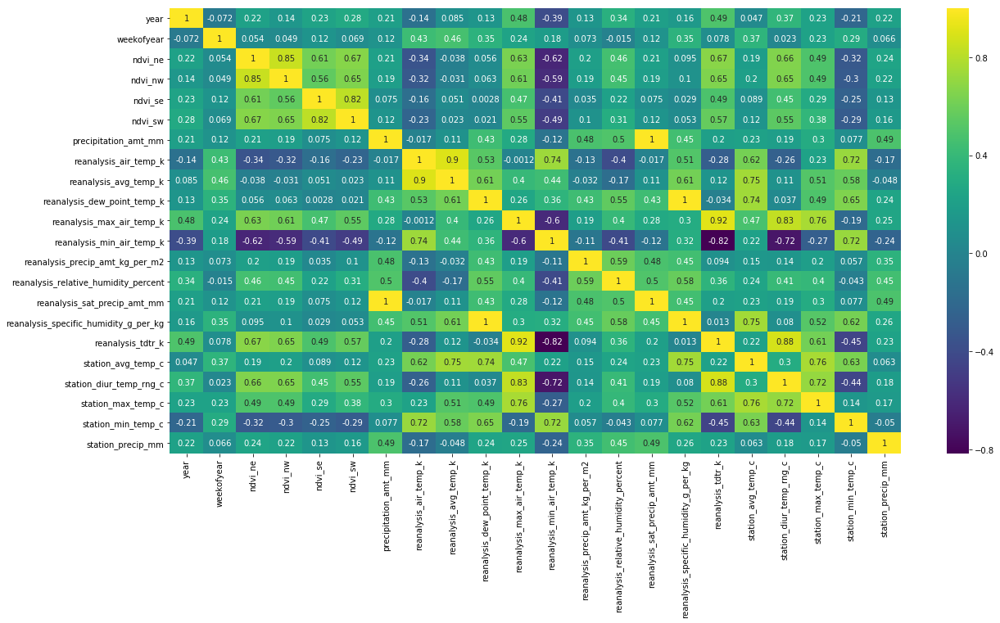

In [8]:
plt.figure(figsize=(20,10))
sns.heatmap(train.corr(),cmap='viridis',annot=True)

In [9]:
labels = pd.read_csv('dataset/dengue_labels_train.csv')

In [10]:
labels.head()

,city,year,weekofyear,total_cases
0,sj,1990,18,4
1,sj,1990,19,5
2,sj,1990,20,4
3,sj,1990,21,3
4,sj,1990,22,6


In [11]:
labels.shape

(1456, 4)

In [12]:
train_labels = pd.merge(train,labels,on=['city','year','weekofyear'],how='inner') 

In [13]:
train_labels['week_start_date'] = pd.to_datetime(train_labels['week_start_date'])

In [14]:
train_labels['month'] = train_labels['week_start_date'].dt.strftime('%m')

In [15]:
train_labels.groupby(['city','year']).sum().total_cases

city  year
iq    2000       4
      2001      14
      2002     704
      2003     114
      2004     638
      2005     311
      2006     436
      2007     365
      2008     801
      2009     324
      2010     223
sj    1990     866
      1991    2801
      1992    2371
      1993    1156
      1994    6533
      1995    1333
      1996     855
      1997    1454
      1998    4595
      1999    1633
      2000     492
      2001    1463
      2002     452
      2003     949
      2004     610
      2005    1805
      2006     550
      2007    1969
      2008     106
Name: total_cases, dtype: int64

In [754]:
train_iq = train_labels[train_labels.city == 'iq']
train_sj = train_labels[train_labels.city != 'iq']

In [16]:
total_cases_by_city_and_month = pd.DataFrame(train_labels.groupby(['city','month']).sum().total_cases) 

In [17]:
total_cases_by_city_and_month.reset_index(inplace=True)

In [18]:
total_cases_by_city_and_month

,city,month,total_cases
0,iq,01,604
1,iq,02,503
2,iq,03,290
3,iq,04,285
4,iq,05,194
5,iq,06,135
6,iq,07,153
7,iq,08,126
8,iq,09,277
9,iq,10,458


In [250]:
sj = go.Bar(x=train_sj.month, y=train_sj.total_cases, name="San Jose")
iq = go.Bar(x=train_iq.month, y=train_iq.total_cases, name="Iquitos")
layout = go.Layout(barmode='stack', title='Quantidade de Casos x Cidade')
barfig = go.Figure(data=[sj, iq], layout=layout)

iplot(barfig)

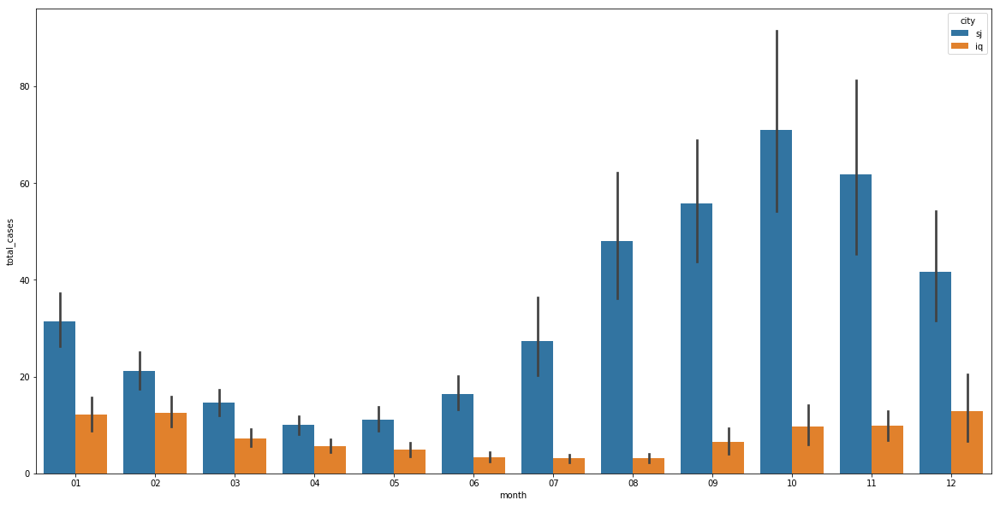

In [19]:
plt.figure(figsize=(20,10))
sns.barplot(train_labels.month,train_labels.total_cases, hue=train_labels.city)

Text(0.5,1,'Temperaturas por Mes - Iquitos')

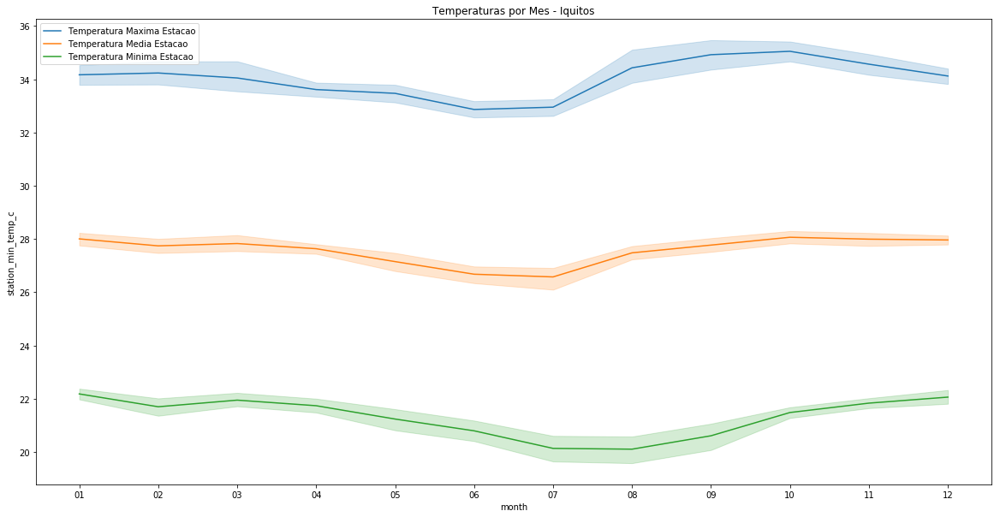

In [884]:
plt.figure(figsize=(20,10))
sns.lineplot(x=train_iq.month,y=train_iq['station_max_temp_c'],label='Temperatura Maxima Estacao')
sns.lineplot(x=train_iq.month,y=train_iq['station_avg_temp_c'],label='Temperatura Media Estacao')
sns.lineplot(x=train_iq.month,y=train_iq['station_min_temp_c'],label='Temperatura Minima Estacao')

plt.title('Temperaturas por Mes - Iquitos')

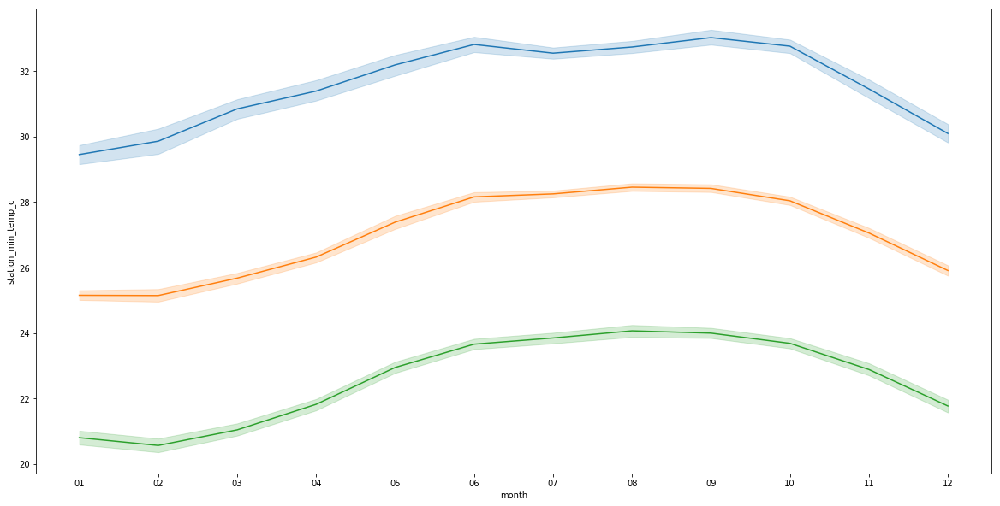

In [209]:
plt.figure(figsize=(20,10))
sns.lineplot(x=train_sj.month,y=train_sj['station_max_temp_c'])
sns.lineplot(x=train_sj.month,y=train_sj['station_avg_temp_c'])
sns.lineplot(x=train_sj.month,y=train_sj['station_min_temp_c'])

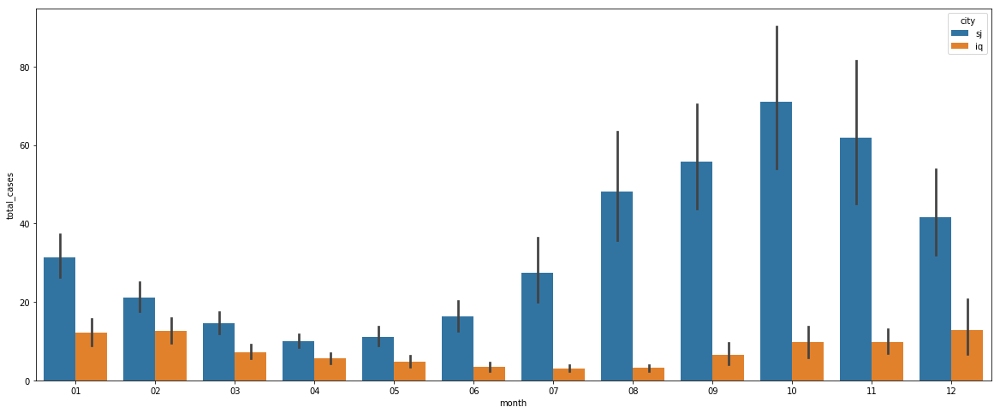

In [151]:
plt.figure(figsize=(20,8))
sns.barplot(x=train_labels['month'], y=train_labels['total_cases'], hue=train_labels['city']);

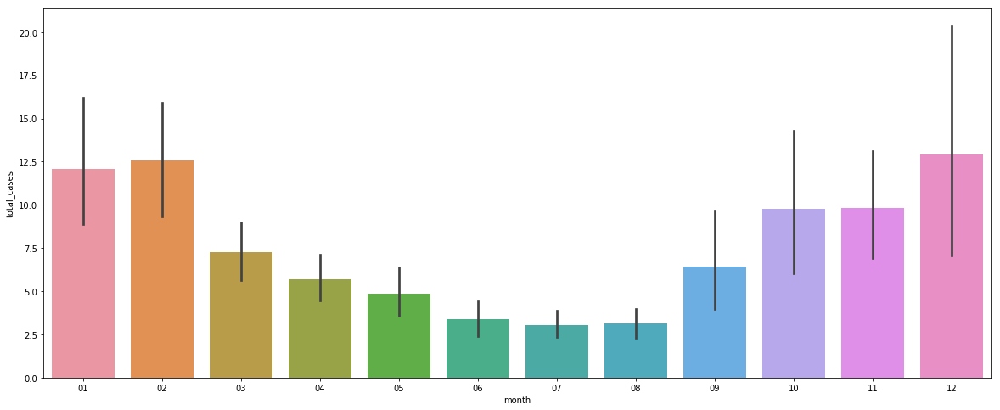

In [251]:
plt.figure(figsize=(20,8))
sns.barplot(x=train_iq.month, y=train_labels.total_cases)

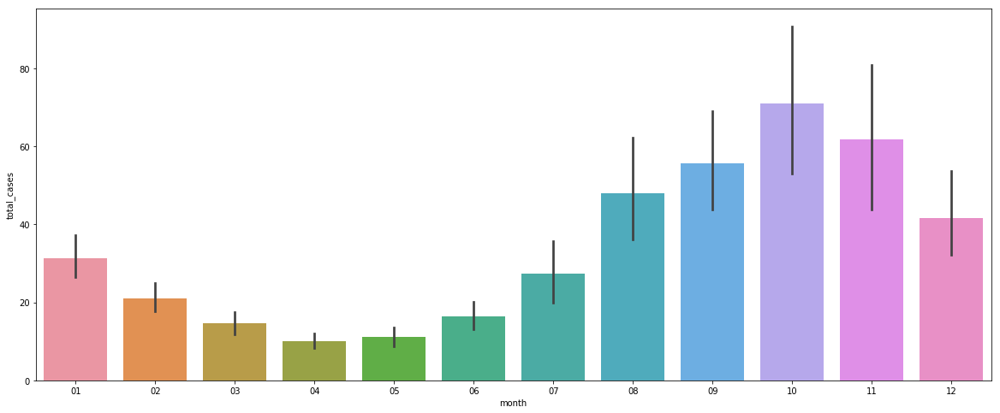

In [252]:
plt.figure(figsize=(20,8))
sns.barplot(x=train_sj.month, y=train_sj.total_cases)

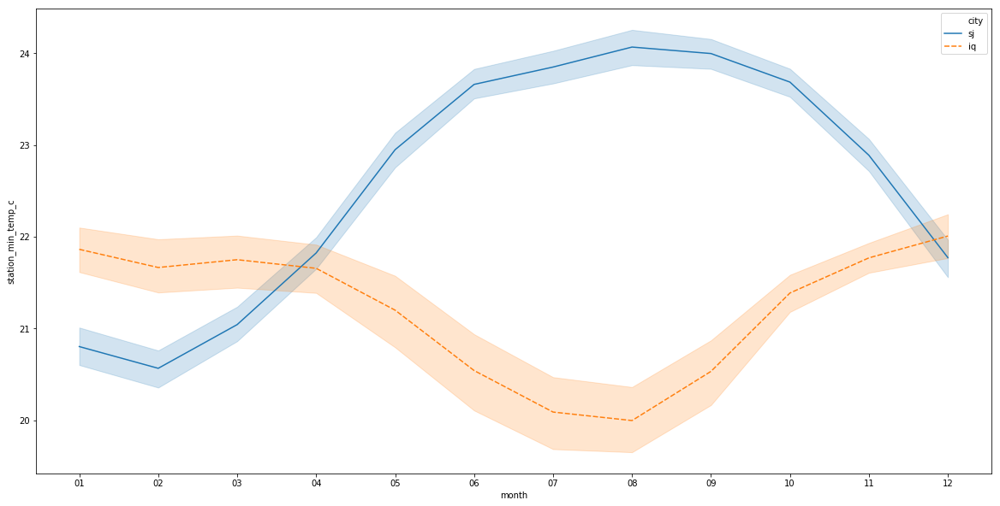

In [258]:
plt.figure(figsize=(20,10))
sns.lineplot(x=train_labels.month,y=train_labels['station_min_temp_c'], hue=train_labels.city,style=train_labels.city)

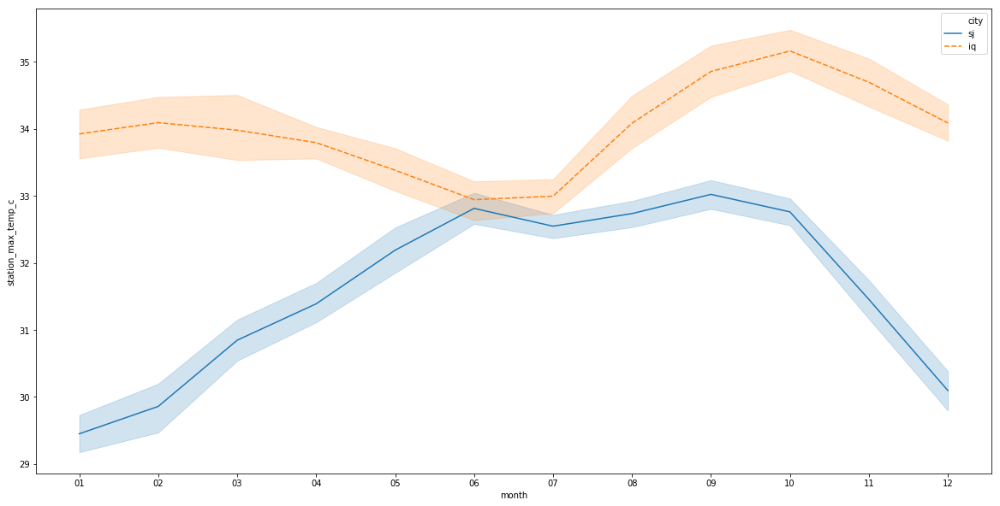

In [257]:
plt.figure(figsize=(20,10))
sns.lineplot(x=train_labels.month,y=train_labels['station_max_temp_c'], hue=train_labels.city,style=train_labels.city)

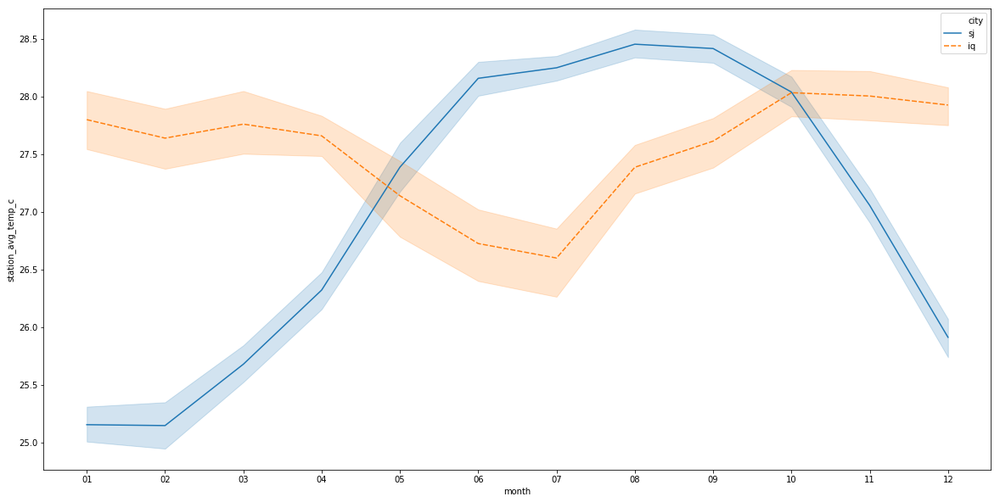

In [259]:
plt.figure(figsize=(20,10))
sns.lineplot(x=train_labels.month,y=train_labels['station_avg_temp_c'], hue=train_labels.city,style=train_labels.city)

In [134]:
train_labels['celsius'] = train_labels.reanalysis_air_temp_k - 273.15

In [366]:
temperatura = pd.DataFrame(train_labels.groupby(['city',
                                                 #'year', 
                                                 #'month',
                                                 'weekofyear', 
                                                 'ndvi_ne', 
                                                 'ndvi_nw', 
                                                 'ndvi_se', 
                                                 'ndvi_sw', 
                                                 'station_min_temp_c',
                                                 'reanalysis_air_temp_k',
                                                 'reanalysis_avg_temp_k'
                                                 ]).sum()['total_cases'])

In [367]:
temperatura.reset_index(inplace=True)

In [368]:
temperatura.sample(5)

,city,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,station_min_temp_c,reanalysis_air_temp_k,reanalysis_avg_temp_k,total_cases
872,sj,26,0.165550,0.120500,0.186186,0.170586,23.3,299.641429,299.707143,6
1175,sj,48,0.043500,-0.060700,0.195157,0.242771,23.3,298.430000,298.457143,8
564,sj,4,0.122533,0.131050,0.188843,0.168871,20.0,297.091429,297.335714,85
146,iq,15,0.382757,0.370971,0.343886,0.376271,19.5,297.175714,298.300000,0
8,iq,2,0.145286,0.142314,0.135300,0.167529,22.1,298.297143,299.935714,9


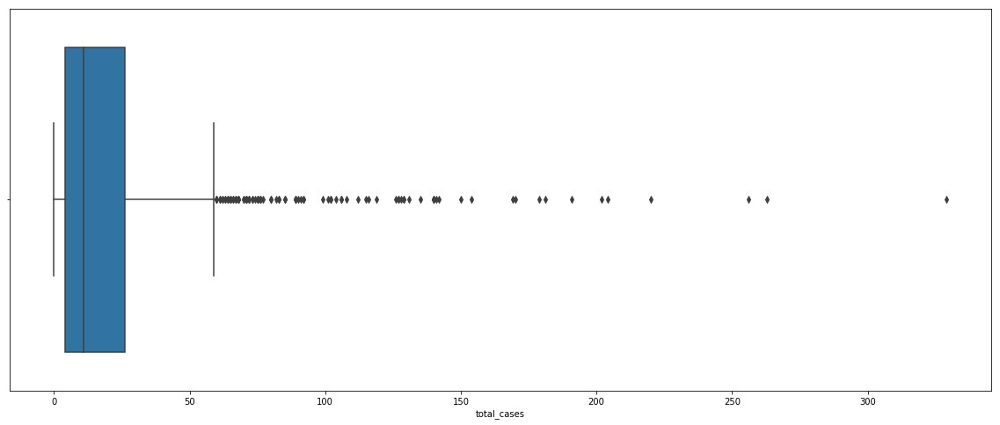

In [369]:
plt.figure(figsize=(20,8))
sns.boxplot(data=temperatura, x='total_cases', hue='city')

In [675]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_auc_score, mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn import model_selection
from sklearn.cross_validation import cross_val_score
from sklearn.model_selection import TimeSeriesSplit
from sklearn.tree import DecisionTreeRegressor


In [403]:
X = temperatura.drop(['city','total_cases'],axis=1)
y = temperatura.total_cases
scaler = StandardScaler()
X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(X[:10])
print(X_train.shape)


[[-1.71361222 -0.13434809  0.34181456 -0.57336964 -0.83663282 -0.14828541
   0.44996774  1.01180633]
 [-1.71361222  0.3430798   0.14593732 -0.41165956 -0.23511456 -0.33913613
   0.4593259   1.02304278]
 [-1.71361222  0.40047748  0.83917736  0.27447032  0.09319662 -1.48424045
   0.13594964  0.32076477]
 [-1.71361222  0.54750528  0.17520042 -0.2182529  -0.87231854 -0.33913613
  -0.98806882 -0.80849826]
 [-1.71361222  0.79440901  0.74985255  0.57910132  0.92393469 -0.14828541
  -0.50040494 -0.19611184]
 [-1.71361222  1.2235132   0.40376365  1.27946722  0.73106403  0.61511746
  -0.35171425  0.6072942 ]
 [-1.71361222  1.28468249  1.3436197   1.62338646  1.28909462  0.23341603
   0.53107176  1.24777174]
 [-1.71361222  1.87211361  1.73997575  2.1476176   2.00464127  0.61511746
  -1.10140648 -1.07255479]
 [-1.64625291  0.01347828  0.03773292 -0.95259262 -0.46416937  0.04256531
  -0.25397351  0.55111196]
 [-1.64625291  0.21329863  0.571478   -0.96587869  0.35411925  0.55150056
  -1.12220238 -0.

In [404]:
lr = LinearRegression()
#cv = KFold(n_splits=10, random_state=42, shuffle=False)
lr.fit(X_train,y_train)
y_pred_lr = lr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_lr)))

28.9330561392


In [405]:
rf = RandomForestRegressor(random_state=0)
#cv = KFold(n_splits=10, random_state=42, shuffle=False)
rf.fit(X_train,y_train)
y_pred_rf = rf.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_rf)))

29.191990082


In [406]:
gbr = GradientBoostingRegressor(random_state=0, max_depth=6, n_estimators=200)
#cv = KFold(n_splits=10, random_state=42, shuffle=False)
gbr.fit(X_train,y_train)
y_pred_gbr = gbr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))

30.0131496398


In [407]:
xgb = XGBRegressor()
#cv = KFold(n_splits=10, random_state=42, shuffle=False)
xgb.fit(X_train,y_train.values.reshape(-1,1))
y_pred_xgb = xgb.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_xgb)))


28.1964318596


In [408]:
lgbm = LGBMRegressor()
lgbm.fit(X_train,y_train)
y_pred_lgbm = lgbm.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_lgbm)))

29.9439043107


In [409]:
import shap

In [410]:
data = pd.DataFrame(X_train, columns=temperatura.drop(['city','total_cases'],axis=1).columns)

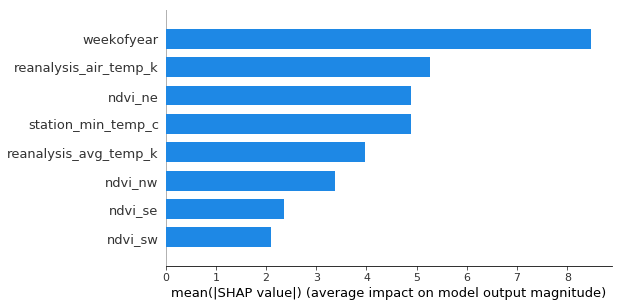

In [411]:
explainer = shap.TreeExplainer(lgbm, data=data)
shap_values = explainer.shap_values(data)
shap.summary_plot(shap_values, data, plot_type='bar')

In [412]:
lr = LinearRegression()
tscv = TimeSeriesSplit(n_splits=3)
lista_lr=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    lr.fit(X_train,y_train)
    y_pred_lr = lr.predict(X_test)
    lista_lr.append(np.sqrt(mean_squared_error(y_test,y_pred_lr)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_lr)))

np.mean(lista_lr)

19.8697568504
21.7946504977
52.9639744248


31.542793924307869

In [413]:
gbr = GradientBoostingRegressor(random_state=0, n_estimators=100)
tscv = TimeSeriesSplit(n_splits=6)
lista_gbr=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    gbr.fit(X_train,y_train)
    y_pred_gbr = gbr.predict(X_test)
    lista_gbr.append(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))
    
np.mean(lista_gbr)

5.18837042629
16.017456477
18.1973039377
17.1666153109
56.9315738561
40.0503595183


25.591946587712787

In [414]:
xgb = XGBRegressor()
tscv = TimeSeriesSplit(n_splits=6)
lista_xgb=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    xgb.fit(X_train,y_train)
    y_pred_xgb = xgb.predict(X_test)
    lista_xgb.append(np.sqrt(mean_squared_error(y_test,y_pred_xgb)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_xgb)))
    
np.mean(lista_xgb)

4.76176116512
16.1134707562
19.0867356006
16.9172992174
57.3302209258
40.1481860387


25.726278950624401

In [415]:
lgbm = LGBMRegressor()
tscv = TimeSeriesSplit(n_splits=6)
lista_lgbm=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    lgbm.fit(X_train,y_train)
    y_pred_lgbm = lgbm.predict(X_test)
    lista_lgbm.append(np.sqrt(mean_squared_error(y_test,y_pred_lgbm)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_lgbm)))
    
np.mean(lista_xgb)

4.63303962071
16.0336963627
17.4140118716
17.5024441719
56.2933137746
43.5622182648


25.726278950624401

In [440]:
train_iq = pd.DataFrame(train_iq.groupby(['city',
                                                 #'year', 
                                                 #'month',
                                                 'weekofyear', 
                                                 'ndvi_ne', 
                                                 'ndvi_nw', 
                                                 'ndvi_se', 
                                                 'ndvi_sw', 
                                                 'station_min_temp_c',
                                                 'reanalysis_air_temp_k',
                                                 'reanalysis_avg_temp_k'
                                                 ]).sum()['total_cases'])

In [441]:
train_iq.reset_index(inplace=True)

In [442]:
train_iq.sample(10)

,city,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,station_min_temp_c,reanalysis_air_temp_k,reanalysis_avg_temp_k,total_cases
11,iq,2,0.229917,0.122340,0.261167,0.223050,21.1,297.725714,299.007143,10
325,iq,33,0.430371,0.433014,0.436914,0.465729,19.8,297.214286,298.500000,5
436,iq,45,0.295129,0.246386,0.302071,0.277000,22.4,299.432857,300.914286,2
84,iq,9,0.307640,0.228217,0.224500,0.291283,20.5,297.038571,298.307143,0
182,iq,19,0.199429,0.150100,0.183467,0.147700,23.4,296.454286,297.964286,1
256,iq,27,0.101543,0.126600,0.119357,0.076243,20.7,294.635714,294.892857,7
160,iq,17,0.239743,0.259271,0.307786,0.307943,21.4,299.048571,300.028571,4
78,iq,9,0.127317,0.181160,0.120467,0.142767,21.2,298.337143,299.664286,12
4,iq,1,0.254714,0.228529,0.250586,0.287000,21.8,297.958571,298.985714,0
301,iq,31,0.237117,0.195617,0.188314,0.133900,18.4,297.291429,299.178571,0


In [444]:
train_iq.shape

(511, 10)

In [445]:
X = train_iq.drop(['city','total_cases'],axis=1)
y = train_iq.total_cases
scaler = StandardScaler()
X = scaler.fit_transform(X)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape

(357, 8)

In [446]:
lr = LinearRegression()
tscv = TimeSeriesSplit(n_splits=3)
lista_lr=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    lr.fit(X_train,y_train)
    y_pred_lr = lr.predict(X_test)
    lista_lr.append(np.sqrt(mean_squared_error(y_test,y_pred_lr)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_lr)))

np.mean(lista_lr)

4.47386963747
7.3960153278
17.0594300796


9.6431050149468316

In [447]:
gbr = GradientBoostingRegressor(random_state=0, n_estimators=100)
tscv = TimeSeriesSplit(n_splits=6)
lista_gbr=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    gbr.fit(X_train,y_train)
    y_pred_gbr = gbr.predict(X_test)
    lista_gbr.append(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))
    
np.mean(lista_gbr)

11.1342916086
5.80936317393
3.77941472846
4.87546186804
14.6496948179
14.3196545566


9.0946467922404608

In [448]:
xgb = XGBRegressor()
tscv = TimeSeriesSplit(n_splits=6)
lista_xgb=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    xgb.fit(X_train,y_train)
    y_pred_xgb = xgb.predict(X_test)
    lista_xgb.append(np.sqrt(mean_squared_error(y_test,y_pred_xgb)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_xgb)))
    
np.mean(lista_xgb)

11.172904928
5.50485806364
3.32231804747
5.17913054149
14.5876581524
13.9144781156


8.9468913081166441

In [450]:
lgbm = LGBMRegressor()
tscv = TimeSeriesSplit(n_splits=6)
lista_lgbm=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    lgbm.fit(X_train,y_train)
    y_pred_lgbm = lgbm.predict(X_test)
    lista_lgbm.append(np.sqrt(mean_squared_error(y_test,y_pred_lgbm)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_lgbm)))
    
np.mean(lista_lgbm)

9.47917882387
5.99335514359
3.71695401163
4.651856706
14.2484775245
14.5573945146


8.7745361207130053

In [462]:
train_sj = pd.DataFrame(train_sj.groupby(['city',
                                                 'year', 
                                                 #'month',
                                                 'weekofyear', 
                                                 'ndvi_ne', 
                                                 'ndvi_nw', 
                                                 'ndvi_se', 
                                                 'ndvi_sw', 
                                                 'station_min_temp_c',
                                                 'reanalysis_air_temp_k',
                                                 'reanalysis_avg_temp_k'
                                                 ]).sum()['total_cases'])

In [698]:
train_sj.reset_index(inplace=True)

In [464]:
train_sj.sample(10)

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,station_min_temp_c,reanalysis_air_temp_k,reanalysis_avg_temp_k,total_cases
701,sj,2007,31,0.074600,0.100400,0.233867,0.243371,24.4,301.081429,301.171429,36
711,sj,2007,45,-0.251700,-0.048600,0.205171,0.172883,22.8,300.604286,300.685714,48
16,sj,1990,39,0.116100,0.260900,0.199443,0.244217,24.4,300.427143,300.600000,27
41,sj,1991,18,0.209167,0.160575,0.176171,0.176171,22.8,298.831429,299.071429,17
615,sj,2005,31,-0.064750,-0.026700,0.140400,0.121200,25.0,301.158571,301.107143,83
584,sj,2004,46,0.019900,-0.001350,0.039000,0.064771,23.9,299.921429,299.971429,4
526,sj,2003,22,-0.045700,-0.007567,0.195914,0.178057,22.8,299.508571,299.685714,7
84,sj,1992,23,0.121650,0.139950,0.110086,0.102229,22.8,299.104286,299.228571,19
287,sj,1997,33,0.008933,0.046675,0.141100,0.158571,23.9,299.840000,299.992857,10
139,sj,1993,36,0.112100,0.068800,0.059600,0.051333,23.3,299.761429,299.857143,28


In [465]:
train_sj.shape

(728, 11)

In [466]:
X = train_sj.drop(['city','total_cases','year'],axis=1)
y = train_sj.total_cases
scaler = StandardScaler()
X = scaler.fit_transform(X)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

X_train.shape

(509, 8)

In [467]:
lr = LinearRegression()
tscv = TimeSeriesSplit(n_splits=3)
lista_lr=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    lr.fit(X_train,y_train)
    y_pred_lr = lr.predict(X_test)
    lista_lr.append(np.sqrt(mean_squared_error(y_test,y_pred_lr)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_lr)))

np.mean(lista_lr)

50.0335741917
34.3492948916
27.9399032414


37.440924108262614

In [468]:
gbr = GradientBoostingRegressor(random_state=0, n_estimators=100)
tscv = TimeSeriesSplit(n_splits=6)
lista_gbr=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    gbr.fit(X_train,y_train)
    y_pred_gbr = gbr.predict(X_test)
    lista_gbr.append(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))
    
np.mean(lista_gbr)

38.218587538
37.2240830485
66.2959303816
48.7832251855
33.3832164278
27.6542645571


41.926551189740479

In [469]:
xgb = XGBRegressor()
tscv = TimeSeriesSplit(n_splits=6)
lista_xgb=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    xgb.fit(X_train,y_train)
    y_pred_xgb = xgb.predict(X_test)
    lista_xgb.append(np.sqrt(mean_squared_error(y_test,y_pred_xgb)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_xgb)))
    
np.mean(lista_xgb)

37.4257154465
38.1121702541
65.5718442722
50.4355471119
30.0380449193
27.8634003909


41.574453732489232

In [470]:
lgbm = LGBMRegressor()
tscv = TimeSeriesSplit(n_splits=6)
lista_lgbm=[]
for train_index, test_index in tscv.split(X,y):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index] 
    y_train, y_test = y[train_index], y[test_index]
    lgbm.fit(X_train,y_train)
    y_pred_lgbm = lgbm.predict(X_test)
    lista_lgbm.append(np.sqrt(mean_squared_error(y_test,y_pred_lgbm)))
    print(np.sqrt(mean_squared_error(y_test,y_pred_lgbm)))
    
np.mean(lista_lgbm)

36.5270863346
36.0998448834
66.0984270731
42.9434943366
34.0045164046
27.7921777864


40.577591136457499

In [505]:
train_iq.year.unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010])

In [476]:
train_iq.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month,celsius
936,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0,07,23.590000
937,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0,07,23.484286
938,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0,07,23.265714
939,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0,07,22.207143
940,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0,07,23.282857


In [504]:
pd.DataFrame(train_iq.groupby(['month','weekofyear','week_start_date']).sum()['total_cases']).reset_index().head()

,month,weekofyear,week_start_date,total_cases
0,01,1,2001-01-01,0
1,01,1,2002-01-01,4
2,01,1,2003-01-01,10
3,01,1,2004-01-01,4
4,01,1,2005-01-08,10


In [503]:
import datetime 
datetime.date(2010, 1, 1).isocalendar()[1]

53

In [565]:
train_iq_until_2005 = train_iq[(train_iq.year <= 2005) & (train_iq.total_cases>0)]

In [566]:
train_iq_until_2005.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month,celsius
946,iq,2000,36,2000-09-09,0.295586,0.295683,0.312214,0.265929,23.12,300.802857,...,12.652857,14.900000,28.366667,12.900,35.8,21.7,56.9,1,09,27.652857
951,iq,2000,41,2000-10-14,0.223533,0.133914,0.349800,0.100917,31.10,298.474286,...,16.071429,13.485714,27.657143,11.300,34.0,21.0,3.0,1,10,25.324286
952,iq,2000,42,2000-10-21,0.274800,0.187057,0.373943,0.279471,25.21,299.211429,...,15.528571,14.928571,27.775000,12.275,36.0,21.0,45.2,1,10,26.061429
960,iq,2000,50,2000-12-16,0.338786,0.316829,0.350343,0.297700,111.06,298.757143,...,16.098571,11.971429,26.616667,9.650,33.8,21.0,67.2,1,12,25.607143
977,iq,2001,16,2001-04-16,0.312543,0.282214,0.262129,0.407486,77.73,297.062857,...,17.520000,7.500000,27.340000,11.040,33.5,20.4,45.3,1,04,23.912857


In [567]:
train_iq_until_2005.year.unique()

array([2000, 2001, 2002, 2003, 2004, 2005])

In [568]:
train_iq_starting_2006 = train_iq[(train_iq.year > 2005) & (train_iq.total_cases>0)]

In [569]:
train_iq_starting_2006.head()

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month,celsius
1222,iq,2006,52,2006-01-01,0.354600,0.219950,0.322517,0.256333,114.58,298.181429,...,18.584286,7.385714,27.45,9.70,32.7,22.4,273.5,8,01,25.031429
1223,iq,2006,1,2006-01-08,0.199514,0.239343,0.227657,0.215500,38.78,298.832857,...,14.524286,12.314286,NaN,NaN,34.5,19.7,70.1,25,01,25.682857
1224,iq,2006,2,2006-01-15,0.228400,0.202071,0.194750,0.230350,138.46,298.728571,...,18.165714,9.885714,27.78,11.00,34.5,21.4,60.1,21,01,25.578571
1225,iq,2006,3,2006-01-22,0.174300,0.133643,0.111757,0.194429,88.85,298.460000,...,17.941429,9.142857,NaN,NaN,33.8,21.5,54.8,10,01,25.310000
1226,iq,2006,4,2006-01-29,0.151767,0.137700,0.147800,0.160783,49.32,297.188571,...,17.364286,6.214286,27.30,8.95,33.5,22.3,250.9,28,01,24.038571


In [570]:
train_iq_starting_2006.year.unique()

array([2006, 2007, 2008, 2009, 2010])

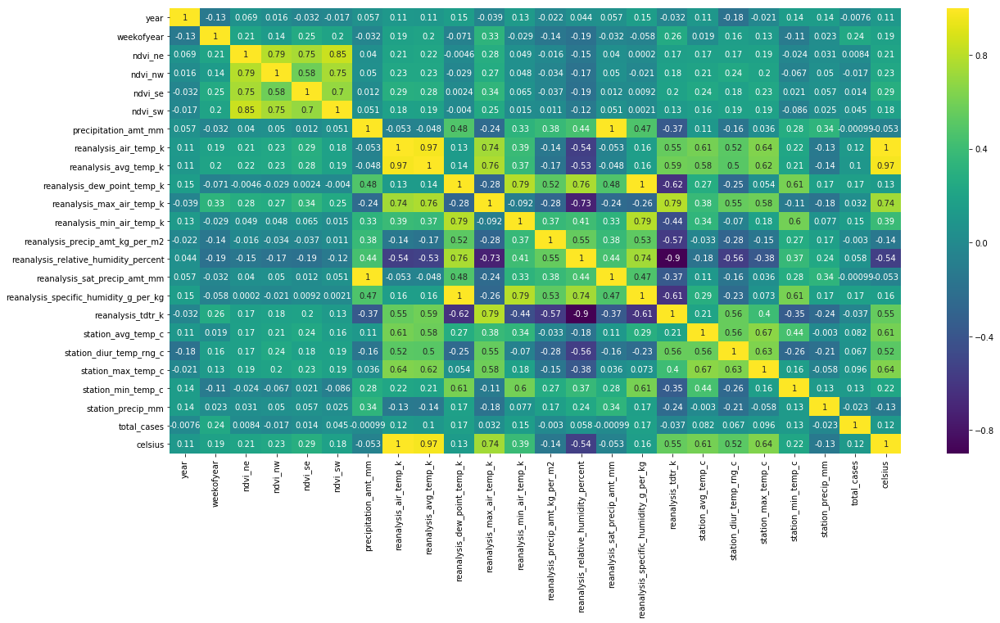

In [571]:
plt.figure(figsize=(20,10))
sns.heatmap(train_iq_until_2005.corr(),cmap='viridis',annot=True)

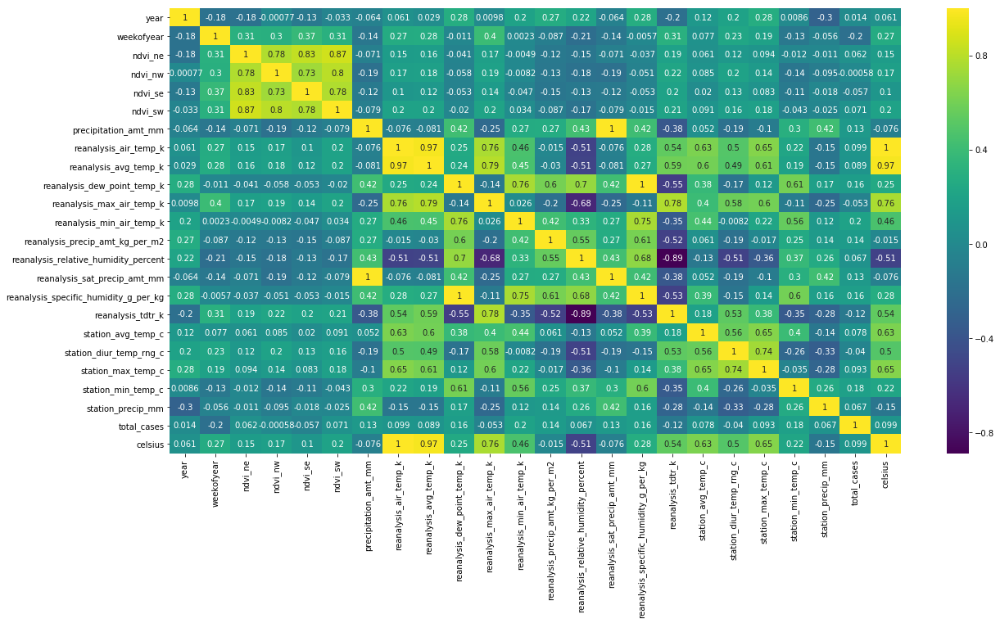

In [572]:
plt.figure(figsize=(20,10))
sns.heatmap(train_iq_starting_2006.corr(),cmap='viridis',annot=True)

In [573]:
train_iq_starting_2006.shape

(219, 27)

In [576]:
train_iq_until_2005.shape

(205, 27)

In [590]:
train_iq_starting_2006_dropna = train_iq_starting_2006.dropna()
train_iq_until_2005_dropna = train_iq_until_2005.dropna()

In [591]:
train_iq_until_2005_dropna.shape

(185, 27)

In [592]:
train_iq_starting_2006_dropna.shape

(202, 27)

In [662]:
X_train = train_iq_until_2005_dropna.drop(['week_start_date','city','total_cases','month','year'],axis=1)
y_train = train_iq_until_2005_dropna.total_cases.values

X_test = train_iq_starting_2006_dropna.drop(['week_start_date','city','total_cases','month','year'],axis=1)
y_test = train_iq_starting_2006_dropna.total_cases

X_train.dropna(inplace=True)
X_test.dropna(inplace=True)

scaler = StandardScaler()
scaler.fit_transform(X_train)
scaler.fit_transform(X_test)

print(X_train.shape)
print(y_train.shape)
print('\n')
print(X_test.shape)
print(y_test.shape)

(185, 22)
(185,)


(202, 22)
(202,)


In [677]:
lr = LinearRegression()
lr.fit(X_train,y_train)
y_pred_lr = lr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_lr)))
print('\n')
print(mean_absolute_error(y_test,y_pred_lr))

11.1165565212


7.79880878713


In [678]:
rf = RandomForestRegressor(random_state=0,n_estimators=10)
rf.fit(X_train,y_train)
y_pred_rf = rf.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_rf)))
print('\n')
print(mean_absolute_error(y_test,y_pred_rf))

10.4978545663


7.01386138614


In [679]:
gbr = GradientBoostingRegressor(random_state=0, max_depth=5, n_estimators=100)
gbr.fit(X_train,y_train)
y_pred_gbr = gbr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_gbr)))
print('\n')
print(mean_absolute_error(y_test,y_pred_gbr))

10.5929318003


6.83338951659


In [666]:
X_train.shape

(185, 22)

In [667]:
train_iq_starting_2006_dropna.shape

(202, 27)

In [671]:
from sklearn.ensemble import AdaBoostRegressor

In [680]:
ada = AdaBoostRegressor(random_state=0, n_estimators=100)
ada.fit(X_train, y_train)
y_pred_ada = ada.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,y_pred_ada)))
print('\n')
print(mean_absolute_error(y_test,y_pred_ada))

10.1511127876


6.43632862814


In [757]:
train_iq['nvdi_mean'] = train_iq[train_iq.columns[4:8]].mean(axis = 1)
train_sj['nvdi_mean'] = train_sj[train_sj.columns[3:7]].mean(axis = 1)

In [758]:
train_iq.set_index('week_start_date', drop = True, inplace = True)
train_sj.set_index('week_start_date', drop = True, inplace = True)

In [766]:
train_iq.dropna(inplace=True)
train_sj.dropna(inplace=True)

In [772]:
train_iq = train_iq[train_iq.total_cases !=0]
train_sj = train_iq[train_sj.total_cases !=0]

/home/wilson_tayar/anaconda3/envs/tera-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



IndexingError: Unalignable boolean Series provided as indexer (index of the boolean Series and of the indexed object do not match

In [743]:
train_sj.reset_index(inplace=True)

In [764]:
train_iq.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month,celsius,nvdi_mean
week_start_date,,,,,,,,,,,,,,,,,,,,,
2000-07-01,iq,2000,26,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,298.450000,...,8.928571,26.400000,10.775000,32.5,20.7,3.0,0,07,23.590000,0.228307
2000-07-08,iq,2000,27,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,298.428571,...,10.314286,26.900000,11.566667,34.0,20.8,55.6,0,07,23.484286,0.256012
2000-07-15,iq,2000,28,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,297.392857,...,7.385714,26.800000,11.466667,33.0,20.7,38.1,0,07,23.265714,0.170504
2000-07-22,iq,2000,29,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,296.228571,...,9.114286,25.766667,10.533333,31.5,14.7,30.0,0,07,22.207143,0.206918
2000-07-29,iq,2000,30,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,297.635714,...,9.500000,26.600000,11.480000,33.3,19.1,4.0,0,07,23.282857,0.316546


In [760]:
train_sj.head()

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases,month,celsius,nvdi_mean
week_start_date,,,,,,,,,,,,,,,,,,,,,
1990-04-30,sj,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,297.742857,...,2.628571,25.442857,6.900000,29.4,20.0,16.0,4,04,24.422857,0.141603
1990-05-07,sj,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,298.442857,...,2.371429,26.714286,6.371429,31.7,22.2,8.6,5,05,25.061429,0.158144
1990-05-14,sj,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,298.878571,...,2.300000,26.714286,6.485714,32.2,22.8,41.4,4,05,25.631429,0.120806
1990-05-21,sj,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,299.228571,...,2.428571,27.471429,6.771429,33.3,23.3,4.0,3,05,25.837143,0.200419
1990-05-28,sj,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,299.664286,...,3.014286,28.942857,9.371429,35.0,23.9,5.8,6,05,26.368571,0.236533


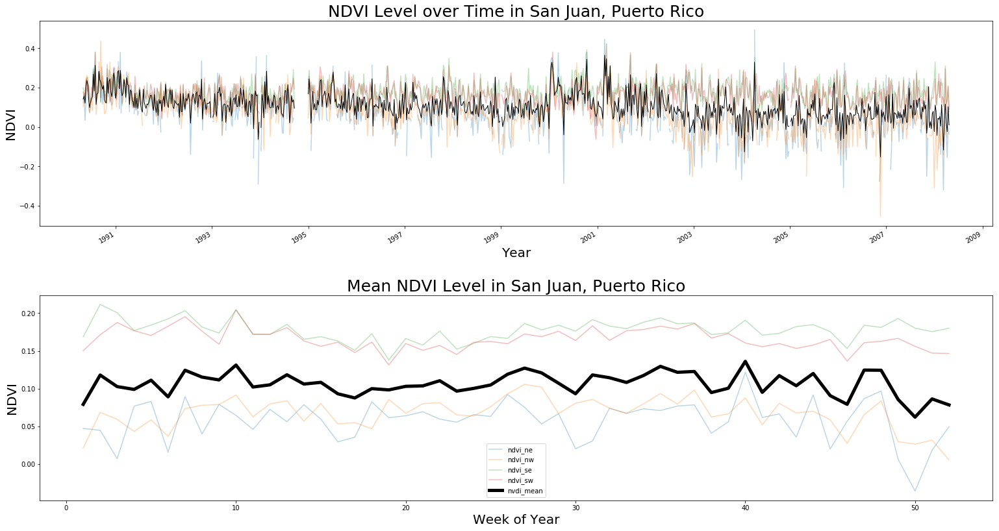

In [765]:

# plot week by week and yearly average for San Juan
fig, ax = plt.subplots(2, 1, figsize=(22, 12))

plt.subplot(211)
for i in train_sj.columns[3:7]:
    train_sj[i].plot(alpha = .3)
train_sj['nvdi_mean'].plot(alpha = 1, c = 'k', linewidth = 1)
plt.title('NDVI Level over Time in San Juan, Puerto Rico', size = 25)
plt.xlabel('Year', size = 20)
plt.ylabel('NDVI', size = 20)

plt.subplot(212)
for i in train_sj.columns[3:7]:
    train_sj.groupby('weekofyear')[i].mean().plot(alpha = .3)
train_sj.groupby('weekofyear')['nvdi_mean'].mean().plot(alpha = 1, c = 'k', linewidth = 5)
plt.title('Mean NDVI Level in San Juan, Puerto Rico', size = 25)
plt.xlabel('Week of Year', size = 20)
plt.ylabel('NDVI', size = 20)
plt.legend(loc = 'best')
    
plt.tight_layout(pad=3)

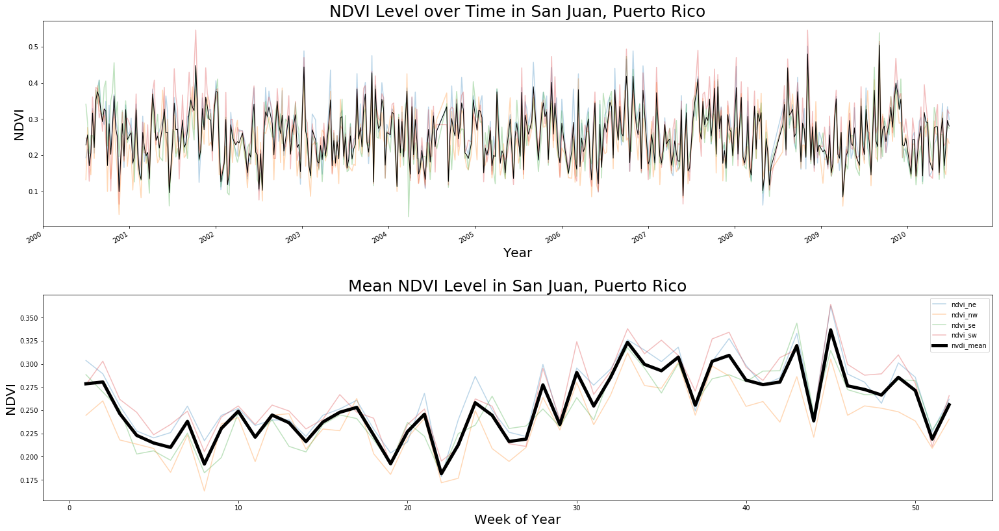

In [768]:
fig, ax = plt.subplots(2, 1, figsize=(22, 12))

plt.subplot(211)
for i in train_iq.columns[3:7]:
    train_iq[i].plot(alpha = .3)
train_iq['nvdi_mean'].plot(alpha = 1, c = 'k', linewidth = 1)
plt.title('Nivel de NDVI por Tempo em Iquitos, Peru', size = 25)
plt.xlabel('Year', size = 20)
plt.ylabel('NDVI', size = 20)

plt.subplot(212)
for i in train_iq.columns[3:7]:
    train_iq.groupby('weekofyear')[i].mean().plot(alpha = .3)
train_iq.groupby('weekofyear')['nvdi_mean'].mean().plot(alpha = 1, c = 'k', linewidth = 5)
plt.title('Media do nivel NDVI em, Puerto Rico', size = 25)
plt.xlabel('Week of Year', size = 20)
plt.ylabel('NDVI', size = 20)
plt.legend(loc = 'best')
    
plt.tight_layout(pad=3)

In [774]:
train_sj.columns

Index(['city', 'year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases', 'month',
       'celsius', 'nvdi_mean'],
      dtype='object')

In [783]:
train_sj_soma = pd.DataFrame(train_sj.groupby(['city', 'week_start_date','year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'month',
       'celsius', 'nvdi_mean']).sum()['total_cases']).reset_index()

In [784]:
train_iq_soma = pd.DataFrame(train_iq.groupby(['city', 'week_start_date','year', 'weekofyear', 'ndvi_ne', 'ndvi_nw', 'ndvi_se',
       'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'month',
       'celsius', 'nvdi_mean']).sum()['total_cases']).reset_index()

In [785]:
train_iq_soma.set_index('week_start_date', drop = True, inplace = True)
train_sj_soma.set_index('week_start_date', drop = True, inplace = True)

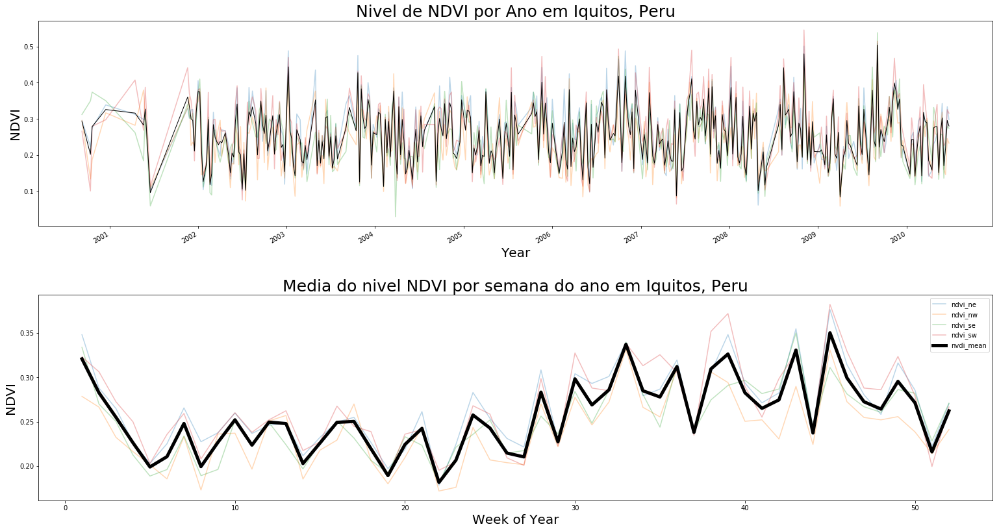

In [791]:
fig, ax = plt.subplots(2, 1, figsize=(22, 12))

plt.subplot(211)
for i in train_iq_soma.columns[3:7]:
    train_iq_soma[i].plot(alpha = .3)
train_iq_soma['nvdi_mean'].plot(alpha = 1, c = 'k', linewidth = 1)
plt.title('Nivel de NDVI por Ano em Iquitos, Peru', size = 25)
plt.xlabel('Year', size = 20)
plt.ylabel('NDVI', size = 20)

plt.subplot(212)
for i in train_iq_soma.columns[3:7]:
    train_iq_soma.groupby('weekofyear')[i].mean().plot(alpha = .3)
train_iq_soma.groupby('weekofyear')['nvdi_mean'].mean().plot(alpha = 1, c = 'k', linewidth = 5)
plt.title('Media do nivel NDVI por semana do ano em Iquitos, Peru', size = 25)
plt.xlabel('Week of Year', size = 20)
plt.ylabel('NDVI', size = 20)
plt.legend(loc = 'best')
    
plt.tight_layout(pad=3)

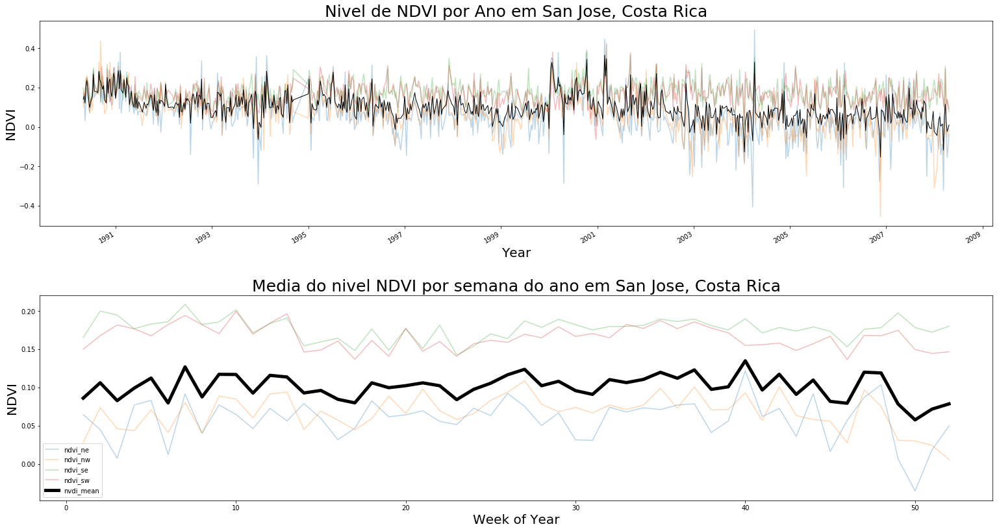

In [792]:
fig, ax = plt.subplots(2, 1, figsize=(22, 12))

plt.subplot(211)
for i in train_sj_soma.columns[3:7]:
    train_sj_soma[i].plot(alpha = .3)
train_sj_soma['nvdi_mean'].plot(alpha = 1, c = 'k', linewidth = 1)
plt.title('Nivel de NDVI por Ano em San Jose, Costa Rica', size = 25)
plt.xlabel('Year', size = 20)
plt.ylabel('NDVI', size = 20)

plt.subplot(212)
for i in train_sj_soma.columns[3:7]:
    train_sj_soma.groupby('weekofyear')[i].mean().plot(alpha = .3)
train_sj_soma.groupby('weekofyear')['nvdi_mean'].mean().plot(alpha = 1, c = 'k', linewidth = 5)
plt.title('Media do nivel NDVI por semana do ano em San Jose, Costa Rica', size = 25)
plt.xlabel('Week of Year', size = 20)
plt.ylabel('NDVI', size = 20)
plt.legend(loc = 'best')
    
plt.tight_layout(pad=3)

In [788]:
train_iq_soma.sample(10)

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,celsius,nvdi_mean,total_cases
week_start_date,,,,,,,,,,,,,,,,,,,,,
2003-03-12,iq,2003,11,0.200000,0.190286,0.158943,0.163629,47.97,296.680000,297.635714,...,6.242857,26.700000,7.500000,32.0,22.1,98.4,03,23.530000,0.178214,4
2003-07-30,iq,2003,31,0.207786,0.156214,0.174329,0.218814,24.64,296.822857,298.357143,...,10.314286,27.225000,9.900000,32.4,21.3,69.1,07,23.672857,0.189286,1
2003-02-12,iq,2003,7,0.313714,0.228414,0.252114,0.286471,70.63,296.585714,297.671429,...,6.028571,26.750000,8.350000,33.2,22.4,55.9,02,23.435714,0.270179,2
2003-02-26,iq,2003,9,0.297600,0.236633,0.229150,0.207283,132.20,299.350000,300.514286,...,9.114286,29.400000,11.200000,35.0,22.9,0.0,02,26.200000,0.242667,5
2006-10-08,iq,2006,40,0.354950,0.247933,0.350814,0.313917,60.48,299.465714,300.435714,...,12.785714,28.700000,14.500000,35.9,21.1,68.9,10,26.315714,0.316904,2
2005-10-22,iq,2005,42,0.307257,0.278214,0.354829,0.286957,73.97,299.578571,301.192857,...,12.242857,29.100000,12.700000,36.5,21.7,64.0,10,26.428571,0.306814,3
2005-07-16,iq,2005,28,0.386929,0.335057,0.329843,0.441343,109.71,296.988571,297.592857,...,11.814286,27.800000,11.133333,34.2,17.6,167.1,07,23.838571,0.373293,3
2001-05-21,iq,2001,21,0.298586,0.379667,0.184243,0.268529,70.81,296.922857,297.957143,...,8.542857,27.433333,11.933333,34.2,20.5,64.1,05,23.772857,0.282756,1
2002-07-02,iq,2002,27,0.101543,0.126600,0.119357,0.076243,3.27,294.635714,294.892857,...,8.700000,26.275000,9.500000,32.6,20.7,5.1,07,21.485714,0.105936,7


In [848]:
def nivel_ndvi(coluna):
    if coluna <= 0.15:
        return 'baixo nivel de vegetacao'
    elif  (coluna > 0.15)&(coluna <= 0.5):
        return 'medio nivel de vegetacao'
    else:
        return 'alto nivel de vegetacao'
    

In [854]:
train_iq_soma[train_iq_soma.nivel_vegetacao=='baixo nivel de vegetacao']

,city,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,...,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,month,celsius,nvdi_mean,total_cases,nivel_vegetacao
week_start_date,,,,,,,,,,,,,,,,,,,,,
2001-06-18,iq,2001,25,0.104100,0.108243,0.059657,0.113757,53.93,296.000000,297.321429,...,26.400000,10.050000,33.2,20.5,9.9,06,22.850000,0.096439,1,baixo nivel de vegetacao
2002-01-22,iq,2002,4,0.104129,0.148329,0.112186,0.141914,121.07,298.915714,299.878571,...,27.940000,11.800000,35.8,21.0,18.0,01,25.765714,0.126639,23,baixo nivel de vegetacao
2002-02-19,iq,2002,8,0.128800,0.122433,0.095943,0.125171,37.46,297.695714,299.021429,...,27.020000,9.780000,33.5,21.0,14.0,02,24.545714,0.118087,8,baixo nivel de vegetacao
2002-02-26,iq,2002,9,0.116200,0.178743,0.089914,0.210414,80.14,297.062857,298.192857,...,26.700000,9.600000,32.2,20.5,47.6,02,23.912857,0.148818,7,baixo nivel de vegetacao
2002-07-02,iq,2002,27,0.101543,0.126600,0.119357,0.076243,3.27,294.635714,294.892857,...,26.275000,9.500000,32.6,20.7,5.1,07,21.485714,0.105936,7,baixo nivel de vegetacao
2002-07-16,iq,2002,29,0.108043,0.072986,0.111229,0.117971,63.00,296.442857,297.742857,...,25.400000,9.000000,30.1,20.1,0.0,07,23.292857,0.102557,4,baixo nivel de vegetacao
2003-02-05,iq,2003,6,0.191450,0.086429,0.136800,0.156714,56.36,297.218571,298.400000,...,26.600000,7.000000,33.8,22.4,41.9,02,24.068571,0.142848,2,baixo nivel de vegetacao
2003-10-29,iq,2003,44,0.134514,0.131471,0.115357,0.121271,32.47,300.041429,300.842857,...,28.733333,11.133333,35.5,22.8,56.4,10,26.891429,0.125654,3,baixo nivel de vegetacao
2004-02-05,iq,2004,6,0.123543,0.099300,0.112857,0.117200,13.20,299.902857,301.371429,...,29.200000,13.525000,36.4,20.6,24.1,02,26.752857,0.113225,3,baixo nivel de vegetacao


In [849]:
train_iq_soma['nivel_vegetacao'] = train_iq_soma.nvdi_mean.apply(nivel_ndvi)

In [850]:
train_sj_soma['nivel_vegetacao'] = train_sj_soma.nvdi_mean.apply(nivel_ndvi)

In [855]:
train_iq_soma_nivel = pd.DataFrame(train_iq_soma.groupby(['nivel_vegetacao']).sum()['total_cases']).reset_index()

In [856]:
train_sj_soma_nivel = pd.DataFrame(train_sj_soma.groupby(['nivel_vegetacao']).sum()['total_cases']).reset_index()

In [857]:
train_iq_qtd_nivel = pd.DataFrame(train_iq_soma.groupby(['nivel_vegetacao']).count()['total_cases']).reset_index()

In [858]:
train_sj_qtd_nivel = pd.DataFrame(train_sj_soma.groupby(['nivel_vegetacao']).count()['total_cases']).reset_index()

In [859]:
train_iq_soma_nivel = train_iq_soma_nivel.sort_values('total_cases',ascending=False)

In [860]:
train_sj_soma_nivel = train_sj_soma_nivel.sort_values('total_cases',ascending=False)

In [861]:
train_iq_qtd_nivel = train_iq_qtd_nivel.sort_values('total_cases',ascending=False)

In [862]:
train_sj_qtd_nivel = train_sj_qtd_nivel.sort_values('total_cases',ascending=False)

In [863]:
train_sj_qtd_nivel

,nivel_vegetacao,total_cases
0,baixo nivel de vegetacao,577
1,medio nivel de vegetacao,150


In [864]:
train_sj_soma_nivel

,nivel_vegetacao,total_cases
0,baixo nivel de vegetacao,17567
1,medio nivel de vegetacao,4399


In [865]:
train_sj_soma_nivel.total_cases / train_sj_qtd_nivel.total_cases 

0    30.445407
1    29.326667
Name: total_cases, dtype: float64

In [868]:
train_iq_soma_nivel

,nivel_vegetacao,total_cases
2,medio nivel de vegetacao,3254
1,baixo nivel de vegetacao,194
0,alto nivel de vegetacao,2


In [873]:
train_iq_qtd_nivel

,nivel_vegetacao,total_cases
2,medio nivel de vegetacao,358
1,baixo nivel de vegetacao,28
0,alto nivel de vegetacao,1


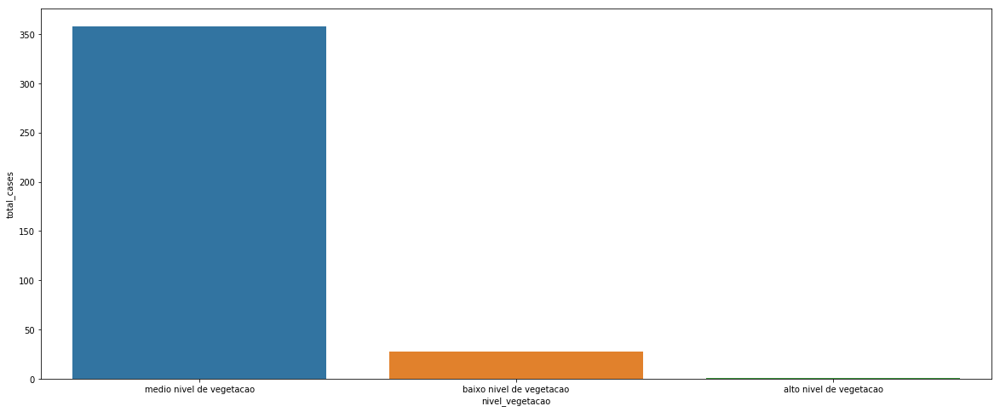

In [871]:
plt.figure(figsize=(20,8))
sns.barplot(x=train_iq_qtd_nivel.nivel_vegetacao, y=train_iq_qtd_nivel.total_cases)

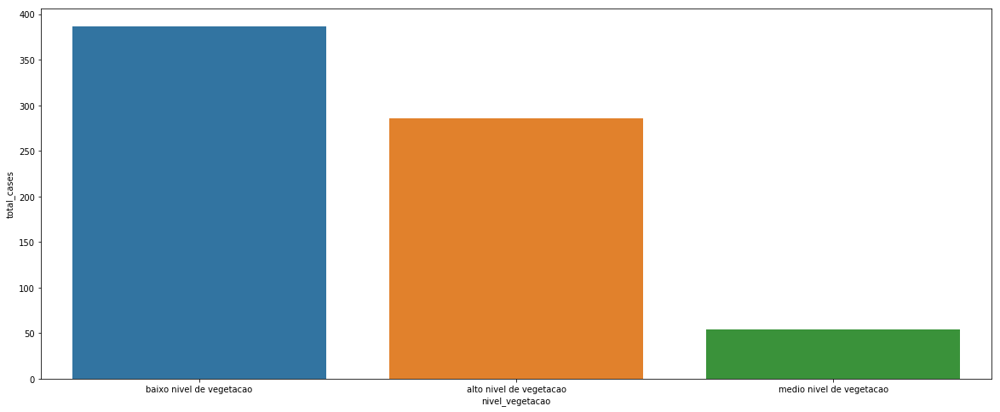

In [830]:
plt.figure(figsize=(20,8))
sns.barplot(x=train_sj_qtd_nivel.nivel_vegetacao, y=train_sj_qtd_nivel.total_cases)

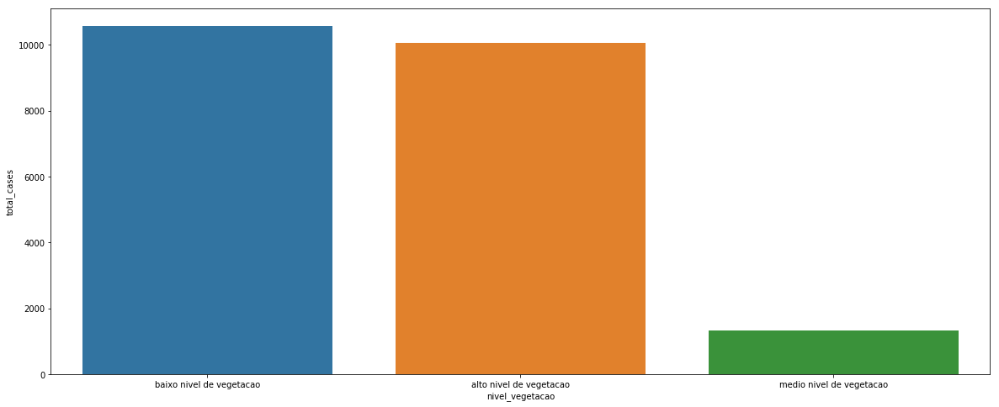

In [831]:
plt.figure(figsize=(20,8))
sns.barplot(x=train_sj_soma_nivel.nivel_vegetacao, y=train_sj_soma_nivel.total_cases)

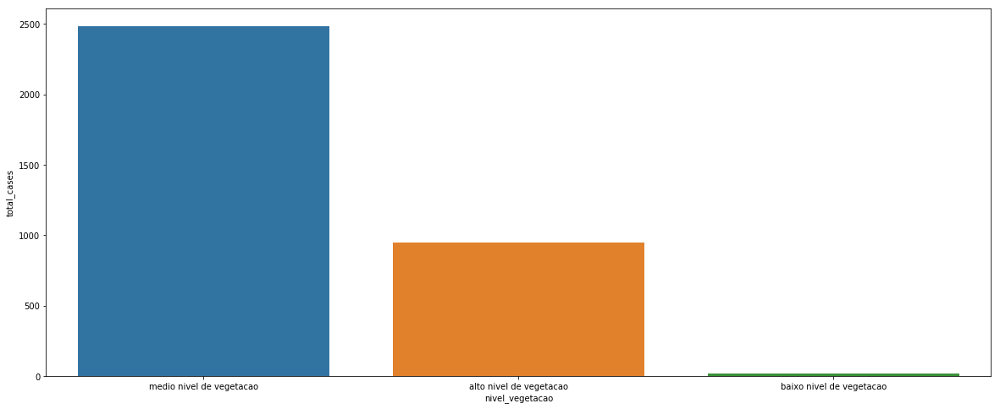

In [832]:
plt.figure(figsize=(20,8))
sns.barplot(x=train_iq_soma_nivel.nivel_vegetacao, y=train_iq_soma_nivel.total_cases)

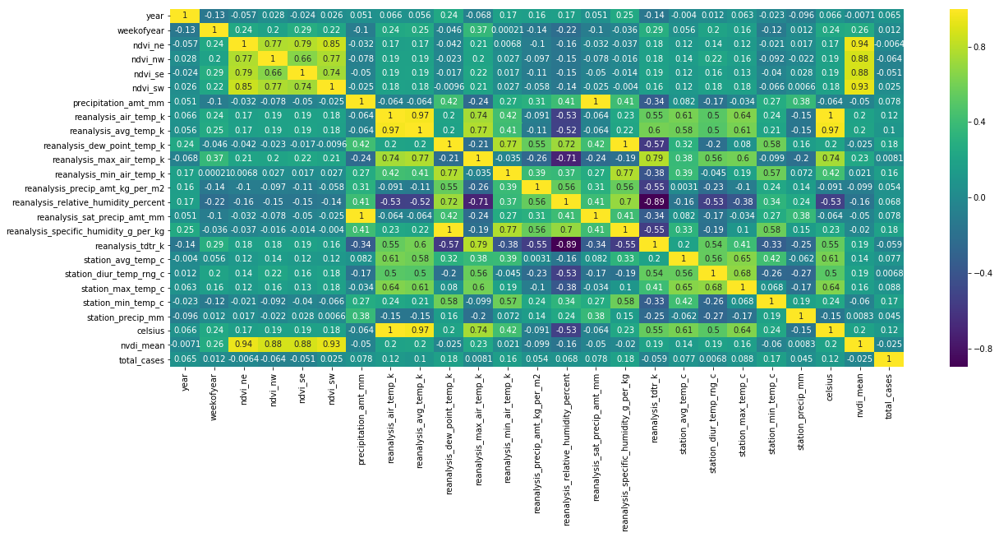

In [874]:
plt.figure(figsize=(20,8))
sns.heatmap(train_iq_soma.corr(),cmap='viridis',annot=True)

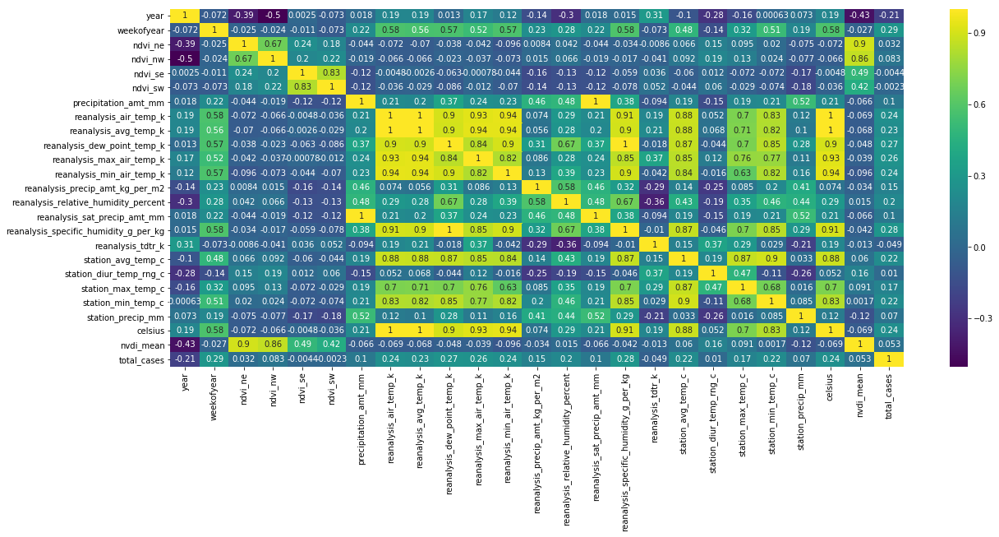

In [875]:
plt.figure(figsize=(20,8))
sns.heatmap(train_sj_soma.corr(),cmap='viridis',annot=True)